#### [ 이미지 변환 - 자르기 변경 ]
- 이미지 전처리 시에 필수
- 수집된 이미지에서 많은 배경 이미지 데이터를 잘라내기 위한 작업
- 원하는 이미지 부분만 추출 위한 작업
- 이미지에 일부를 잘라내는 경우 즉, 이미지 데이터 증가에도 사용.

In [5]:
import seaborn as sns
import pandas as pd # 데이터 분석 및 전처리
import numpy as np # 숫자처리
import matplotlib.pyplot as plt # 데이터 시각화
import cv2
import os

In [10]:
imgDir = '../_data/_image/'
videoDir = '../_data/_video/'
fileName = 'Dog_ (57).jpg'

In [11]:
colorImg = cv2.imread(imgDir+fileName, cv2.IMREAD_COLOR)
if colorImg is not False:
    print(fileName)
    print(f"shape: {colorImg.shape}     ndim: {colorImg.ndim}")
else:
    print(f'{colorImg} check')

Dog_ (57).jpg
shape: (831, 1247, 3)     ndim: 3


3-1 이미지 축소
     이미지데이터 , 축소w, h


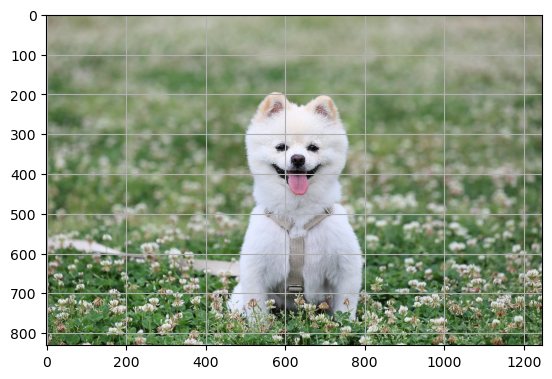

In [12]:
## 이미지 확인
rgbIMG = cv2.cvtColor(colorImg, cv2.COLOR_BGR2RGB)

plt.imshow(rgbIMG)
plt.grid()
plt.show()

[3] 이미지자르기

In [33]:
## 현재 이미지 크기 
H, W, _ = rgbIMG.shape

## - 자르고 싶은 크기
X, Y, nh, nw =  500,200, 250, 250
## 가능한 범위 여부 체크.
isValid =  (X+nw <= W) and (Y+nh <= H)
print(f"가능한 범위 여부{isValid}")
cropIMG = rgbIMG[Y:Y+nh,X:X+nw]

가능한 범위 여부True


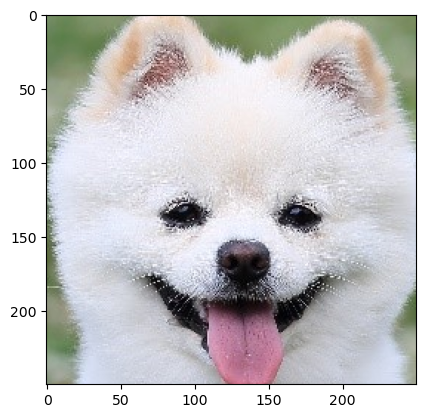

In [34]:
plt.imshow(rgbIMG)
plt.imshow(cropIMG)
plt.show()

In [37]:
cropIMG = cv2.cvtColor(cropIMG, cv2.COLOR_BGR2RGB)

In [39]:
def grayscale(img):
    grayImg = cv2.cvtColor(img, cv2.IMREAD_GRAYSCALE)
    return grayImg

In [42]:
def resize(img):
    meanImg = cv2.resize(img, (800, 1040), interpolation=cv2.INTER_AREA)
    return meanImg

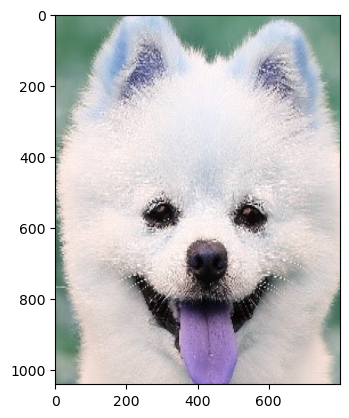

In [43]:
plt.imshow(resize(cropIMG))

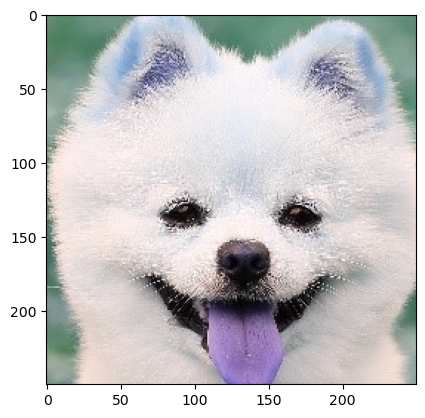

In [41]:
plt.imshow(grayscale(cropIMG))

In [64]:
def resize(img):
    meanImg = cv2.resize(img, (800, 1040), interpolation=cv2.INTER_AREA)
    return meanImg
def grayscale(img):
    grayImg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return grayImg
def flip_rotate(img,fileName):
    for i in [0,1]:
        hflipImg = cv2.flip(colorImg, i)
        for j in range(0,361,30):
            H, W, _ = hflipImg.shape
            a = cv2.getRotationMatrix2D((W/2,H/2), j, 1)
            b = cv2.warpAffine(hflipImg,a,(W,H))
            # cv2.imwrite(imgDir2+str(j)+fileName,b)
            plt.imshow(b)
            

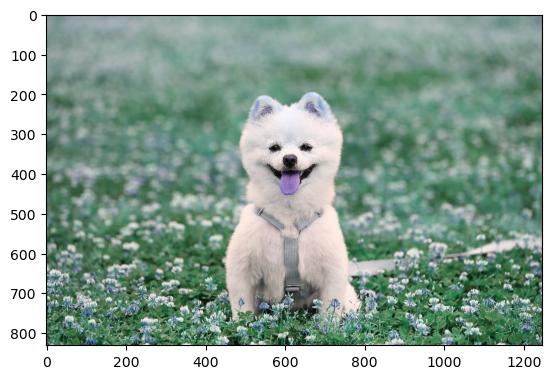

In [66]:
flip_rotate(grayscale(colorImg), 'abc')

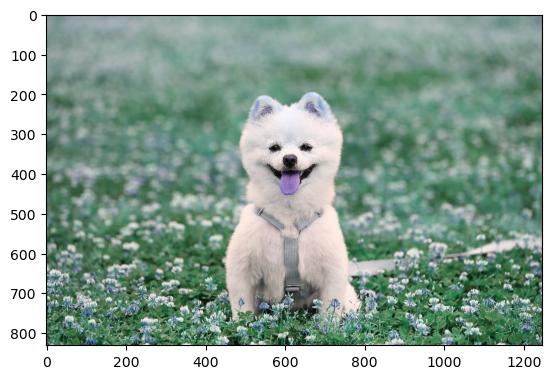

In [65]:
imgDir2 = '../_data/_image/cat_dog_fin/'
flip_rotate(grayscale(resize(colorImg)),cropIMG)

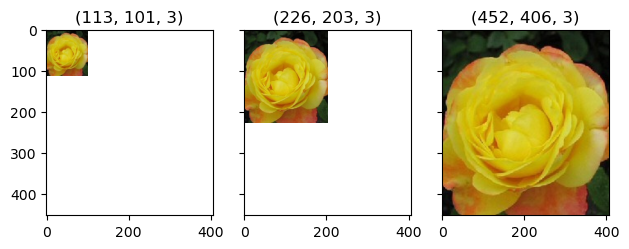

In [ ]:
### opencv 채널 순서 BGR ===> 일반 채널 순서 RGB 변환
# cv2.cvtColor(이미지데이터, 변형형식)

downImg2 = cv2.cvtColor(downImg, cv2.COLOR_BGR2RGB)
colorImg2 = cv2.cvtColor(colorImg, cv2.COLOR_BGR2RGB)
upImg2 = cv2.cvtColor(upImg, cv2.COLOR_BGR2RGB)

#시각화
drawImage(1,3, [downImg2, colorImg2, upImg2])

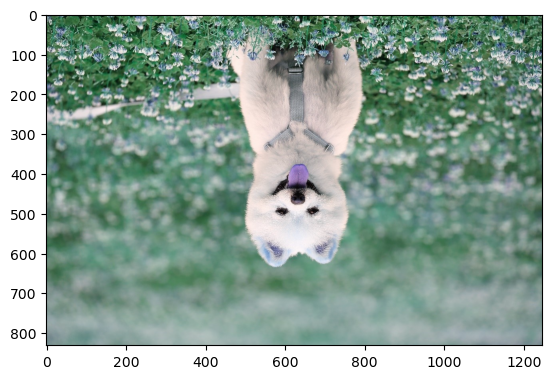

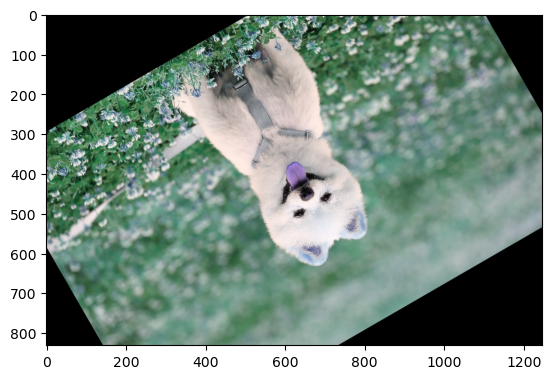

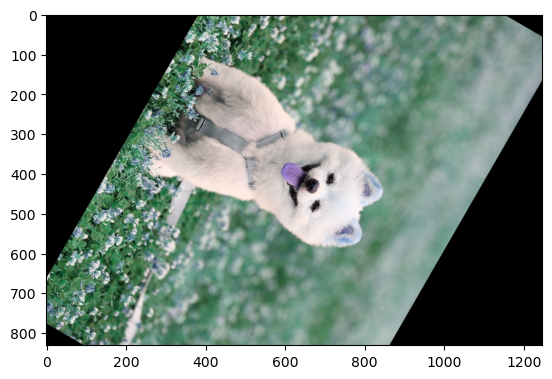

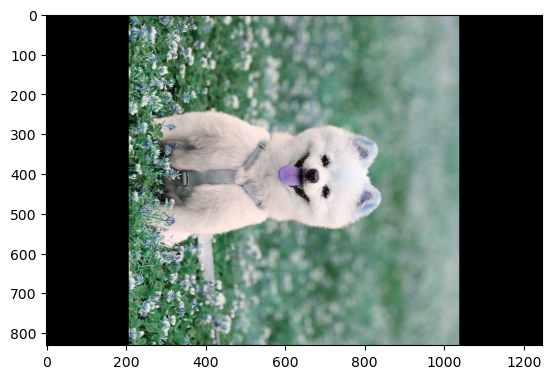

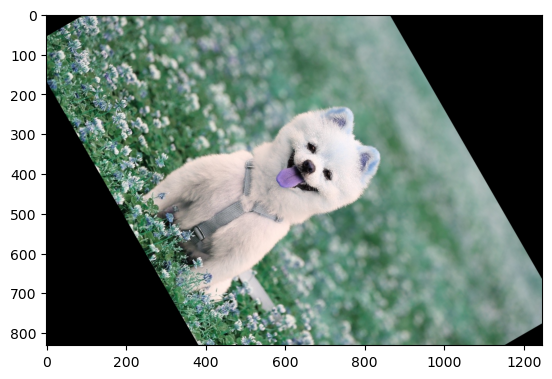

...

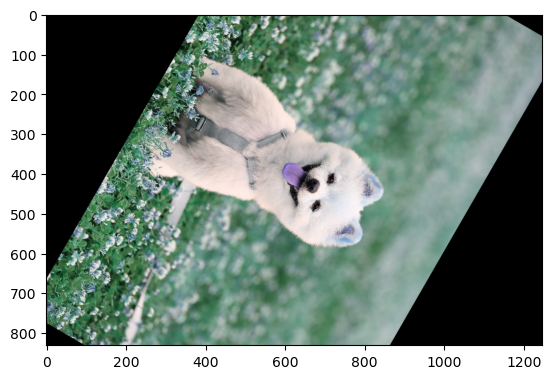

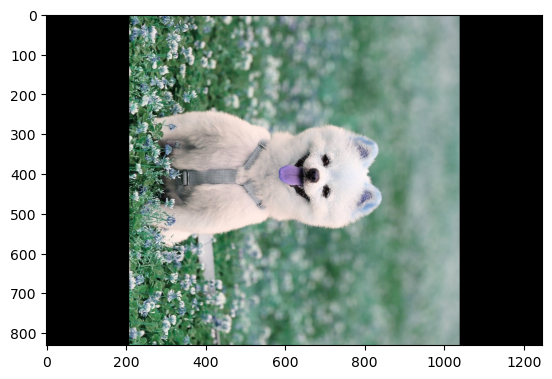

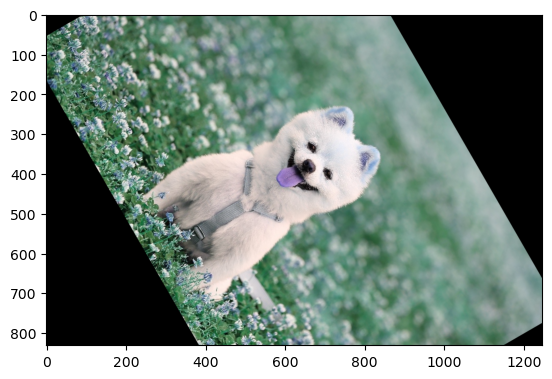

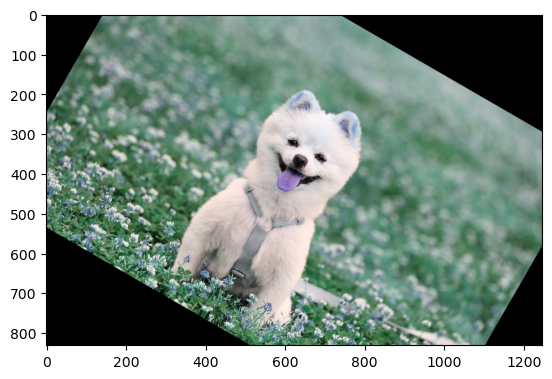

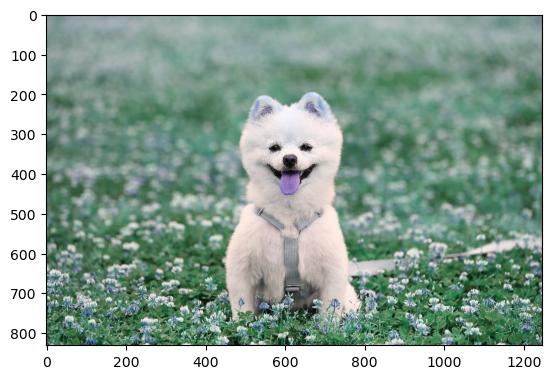

In [53]:
imgDir2 = '../_data/_image/cat_dog_fin/'
flip_rotate(colorImg,fileName )

In [38]:
cv2.imwrite(imgDir+'crop_'+fileName, cropIMG)

True